In [1]:
import csv
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import math
import random
import pygal
from random import uniform
from datetime import date

## Création du dataset et classification

In [2]:
csvFilePath = r'Dataset_PRM_Mathis.xlsx'
df = pd.read_excel(csvFilePath)
df = df.drop(columns=['Unnamed: 7', 'Departement', 'Nbcar'])
df = df.rename(columns={"Unnamed: 6": "nom DPT"})
df.drop_duplicates(subset =['Nom_commune','latitude','longitude'], keep = 'first', inplace=True)
df

,Nom_commune,Code_postal,latitude,longitude,DPT,Nom DPT,Unnamed: 9
0,BOURG EN BRESSE,1000,46.205152,5.246021,1,Ain,NaN
2,ST DENIS LES BOURG,1000,46.211200,5.184628,1,Ain,NaN
3,FRANCHELEINS,1090,46.073595,4.812936,1,Ain,NaN
4,GUEREINS,1090,46.106625,4.781594,1,Ain,NaN
6,GENOUILLEUX,1090,46.120161,4.792882,1,Ain,NaN
...,...,...,...,...,...,...,...
38711,BETHEMONT LA FORET,95840,49.054317,2.251140,95,Val-d'Oise,NaN
38712,MAREIL EN FRANCE,95850,49.070038,2.417538,95,Val-d'Oise,NaN
38713,JAGNY SOUS BOIS,95850,49.081428,2.443995,95,Val-d'Oise,NaN
38714,BEZONS,95870,48.925981,2.211334,95,Val-d'Oise,NaN


In [3]:
listOilCommune = []
listOccCommune = []
for row in df.itertuples():
    if type(row[1]) == bool:
        continue
    row[1].replace('-',' ')
    for word in row[1].split(' '):
        if  word.endswith("AY") or word.endswith("É") or word.endswith("EY") or word.endswith("ACH") or word.endswith("ICH") or word.endswith("IG") or word.endswith("ECQUE") or word.endswith("ECQUES") or word.endswith("IES") or word.endswith("IERS") or word.endswith("EZ") or word.endswith("ANGE") or word.endswith("ANGES") or word.endswith("ING")  or word.endswith("INES") or word.endswith("INGUE") or word.endswith("INGEN") or word.endswith("HAM") or word.endswith("HEM") or word.endswith("HEIM") or word.endswith("COURT") or word.endswith("VILLER") or word.endswith("WILLER")  or word.endswith("Y"):
            listOilCommune.append(row)
            break
        if word.endswith("OSSE") or word.endswith("OSQUE") or word.endswith("ASQUE")  or word.endswith("AT") or word.endswith("ACQ") or word.endswith("AS")  or word.endswith("ANS") or word.endswith("ARGUES") or word.endswith("ENS") or word.endswith("EINS") or word.endswith("EIN") or word.endswith("VIELLE") or word.endswith("FIELLE") or word.find("CAST") != -1 or word.find("CAZ") != -1 or word.find("LH") != -1 or word.find("NH") != -1 or word.find("QUERCY") != -1:
            listOccCommune.append(row)


print(len(listOilCommune))
print(len(listOccCommune))

7687
2138


In [4]:
dict = {}
elementAux = ''
for element in listOilCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] += 1
    print("Oil : " + element[1] + " | "+ elementAux + " = " + str(dict[elementAux]))
for element in listOccCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] -= 1
    print("Occ : " + element[1] + " | " + elementAux + " = " + str(dict[elementAux]))
print(dict)
dictOil = {}
dictOcc= {}
for element in dict.keys():
    if dict[element] < 0:
        dictOcc.setdefault(element, 0)
        dictOcc[element] = dict[element]
    elif dict[element] > 0:
        dictOil.setdefault(element, 0)
        dictOil[element] = dict[element]
print(dictOil)
print(dictOcc)

Oil : LURCY | 01 = 1
Oil : PIZAY | 01 = 2
Oil : THOISSEY | 01 = 3
Oil : CHAZEY SUR AIN | 01 = 4
Oil : ST SORLIN EN BUGEY | 01 = 5
Oil : VAUX EN BUGEY | 01 = 6
Oil : PRIAY | 01 = 7
Oil : SEGNY | 01 = 8
Oil : CHEVRY | 01 = 9
Oil : VESANCY | 01 = 10
Oil : CESSY | 01 = 11
Oil : BOISSEY | 01 = 12
Oil : ARBIGNY | 01 = 13
Oil : CHEZERY FORENS | 01 = 14
Oil : MONTANGES | 01 = 15
Oil : FERNEY VOLTAIRE | 01 = 16
Oil : SAUVERNY | 01 = 17
Oil : GRILLY | 01 = 18
Oil : ST RAMBERT EN BUGEY | 01 = 19
Oil : TENAY | 01 = 20
Oil : CHALEY | 01 = 21
Oil : CERTINES | 01 = 22
Oil : HAUTECOURT ROMANECHE | 01 = 23
Oil : CHAMPAGNE EN VALROMEY | 01 = 24
Oil : HAUT VALROMEY | 01 = 25
Oil : VALROMEY SUR SERAN | 01 = 26
Oil : ARVIERE EN VALROMEY | 01 = 27
Oil : COLIGNY | 01 = 28
Oil : BEY | 01 = 29
Oil : ARBOYS EN BUGEY | 01 = 30
Oil : BELLEY | 01 = 31
Oil : CHAZEY BONS | 01 = 32
Oil : ST REMY | 01 = 33
Oil : CHATENAY | 01 = 34
Oil : LE PLANTAY | 01 = 35
Oil : BENY | 01 = 36
Oil : MIONNAY | 01 = 37
Oil : ST ANDRE D

Oil : ECURY LE REPOS | 51 = 73
Oil : EUVY | 51 = 74
Oil : FAUX FRESNAY | 51 = 75
Oil : CONNANTRAY VAUREFROY | 51 = 76
Oil : SONGY | 51 = 77
Oil : TOGNY AUX BOEUFS | 51 = 78
Oil : MAIRY SUR MARNE | 51 = 79
Oil : ECURY SUR COOLE | 51 = 80
Oil : POGNY | 51 = 81
Oil : OMEY | 51 = 82
Oil : ABLANCOURT | 51 = 83
Oil : AULNAY L AITRE | 51 = 84
Oil : VITRY LA VILLE | 51 = 85
Oil : CHEPY | 51 = 86
Oil : BREUVERY SUR COOLE | 51 = 87
Oil : GRANGES SUR AUBE | 51 = 88
Oil : ALLEMANCHE LAUNAY ET SOYER | 51 = 89
Oil : MARCILLY SUR SEINE | 51 = 90
Oil : ESCLAVOLLES LUREY | 51 = 91
Oil : VILLIERS AUX CORNEILLES | 51 = 92
Oil : BANNAY | 51 = 93
Oil : MONTMORT LUCY | 51 = 94
Oil : FEREBRIANGES | 51 = 95
Oil : SUIZY LE FRANC | 51 = 96
Oil : CONGY | 51 = 97
Oil : BEAUNAY | 51 = 98
Oil : ST REMY EN BOUZEMONT ST GENEST ISSON | 51 = 99
Oil : LANDRICOURT | 51 = 100
Oil : ARRIGNY | 51 = 101
Oil : LARZICOURT | 51 = 102
Oil : DROSNAY | 51 = 103
Oil : GIGNY BUSSY | 51 = 104
Oil : MARGERIE HANCOURT | 51 = 105
Oil : 

Oil : LIMEY REMENAUVILLE | 54 = 131
Oil : MAMEY | 54 = 132
Oil : CHAREY | 54 = 133
Oil : CIREY SUR VEZOUZE | 54 = 134
Oil : XIVRY CIRCOURT | 54 = 135
Oil : PREUTIN HIGNY | 54 = 136
Oil : VANDOEUVRE LES NANCY | 54 = 137
Oil : PAGNY SUR MOSELLE | 54 = 138
Oil : PRENY | 54 = 139
Oil : FENNEVILLER | 54 = 140
Oil : VENEY | 54 = 141
Oil : BADONVILLER | 54 = 142
Oil : MONTIGNY | 54 = 143
Oil : NEUVILLER LES BADONVILLER | 54 = 144
Oil : SEXEY AUX FORGES | 54 = 145
Oil : MERCY LE HAUT | 54 = 146
Oil : ANDERNY | 54 = 147
Oil : SANCY | 54 = 148
Oil : LAY ST REMY | 54 = 149
Oil : HUSSIGNY GODBRANGE | 54 = 150
Oil : VILLERS LES NANCY | 54 = 151
Oil : RAUCOURT | 54 = 152
Oil : SIVRY | 54 = 153
Oil : THEZEY ST MARTIN | 54 = 154
Oil : CLEMERY | 54 = 155
Oil : NOMENY | 54 = 156
Oil : ABAUCOURT | 54 = 157
Oil : CHENICOURT | 54 = 158
Oil : MAILLY SUR SEILLE | 54 = 159
Oil : EPLY | 54 = 160
Oil : LETRICOURT | 54 = 161
Oil : JOPPECOURT | 54 = 162
Oil : DONCOURT LES LONGUYON | 54 = 163
Oil : FLAVIGNY SUR MO

Oil : JUILLY | 77 = 60
Oil : MORET LOING ET ORVANNE | 77 = 61
Oil : USSY SUR MARNE | 77 = 62
Oil : CHAMIGNY | 77 = 63
Oil : MITRY MORY | 77 = 64
Oil : ST FARGEAU PONTHIERRY | 77 = 65
Oil : PRINGY | 77 = 66
Oil : DAGNY | 77 = 67
Oil : ST BARTHELEMY | 77 = 68
Oil : FRETOY | 77 = 69
Oil : CHOISY EN BRIE | 77 = 70
Oil : MEILLERAY | 77 = 71
Oil : ST REMY LA VANNE | 77 = 72
Oil : JOUY SUR MORIN | 77 = 73
Oil : SANCY LES PROVINS | 77 = 74
Oil : CRISENOY | 77 = 75
Oil : LAGNY SUR MARNE | 77 = 76
Oil : THORIGNY SUR MARNE | 77 = 77
Oil : PRECY SUR MARNE | 77 = 78
Oil : CHARMENTRAY | 77 = 79
Oil : VILLEROY | 77 = 80
Oil : CHARNY | 77 = 81
Oil : MESSY | 77 = 82
Oil : CLAYE SOUILLY | 77 = 83
Oil : GRESSY | 77 = 84
Oil : LE PLESSIS PLACY | 77 = 85
Oil : TROCY EN MULTIEN | 77 = 86
Oil : DHUISY | 77 = 87
Oil : LIZY SUR OURCQ | 77 = 88
Oil : MARY SUR MARNE | 77 = 89
Oil : JABLINES | 77 = 90
Oil : ISLES LES VILLENOY | 77 = 91
Oil : ESBLY | 77 = 92
Oil : MONTRY | 77 = 93
Oil : VIGNELY | 77 = 94
Oil : SOU

Oil : CUSSY LES FORGES | 89 = 123
Oil : PISY | 89 = 124
Oil : SAUVIGNY LE BEUREAL | 89 = 125
Oil : BIERRY LES BELLES FONTAINES | 89 = 126
Oil : SANTIGNY | 89 = 127
Oil : MELISEY | 89 = 128
Oil : TRICHEY | 89 = 129
Oil : TANLAY | 89 = 130
Oil : RUGNY | 89 = 131
Oil : THOREY | 89 = 132
Oil : BLACY | 89 = 133
Oil : PRECY LE SEC | 89 = 134
Oil : ANGELY | 89 = 135
Oil : VEZELAY | 89 = 136
Oil : FOISSY LES VEZELAY | 89 = 137
Oil : DOMECY SUR CURE | 89 = 138
Oil : FONTENAY PRES VEZELAY | 89 = 139
Oil : TRUCY SUR YONNE | 89 = 140
Oil : FESTIGNY | 89 = 141
Oil : COULANGES SUR YONNE | 89 = 142
Oil : LUCY SUR YONNE | 89 = 143
Oil : BUSSY LE REPOS | 89 = 144
Oil : MARSANGY | 89 = 145
Oil : ETIGNY | 89 = 146
Oil : PASSY | 89 = 147
Oil : FONTENOY | 89 = 148
Oil : MOUTIERS EN PUISAYE | 89 = 149
Oil : TREIGNY PERREUSE STE COLOMBE | 89 = 150
Oil : THURY | 89 = 151
Oil : CHITRY | 89 = 152
Oil : HERY | 89 = 153
Oil : MOUFFY | 89 = 154
Oil : DRUYES LES BELLES FONTAINES | 89 = 155
Oil : MERRY SEC | 89 = 15

## Affichage sous forme de carte

OSError: no library called "cairo-2" was found
no library called "cairo" was found
no library called "libcairo-2" was found
cannot load library 'libcairo.so.2': error 0x7e
cannot load library 'libcairo.2.dylib': error 0x7e
cannot load library 'libcairo-2.dll': error 0x7e

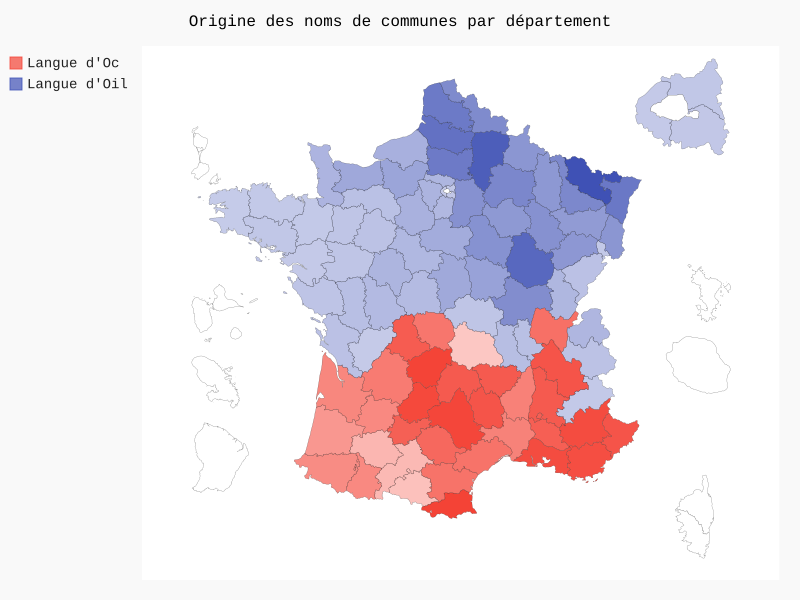

In [5]:
fr_chart = pygal.maps.fr.Departments(human_readable=True)
fr_chart.title = 'Origine des noms de communes par département'
fr_chart.add('Langue d\'Oc', dictOcc)
fr_chart.add('Langue d\'Oil', dictOil)

# En positionnant les critères Occ avant les critères Oil.

In [6]:
listOilCommune = []
listOccCommune = []
for row in df.itertuples():
    if type(row[1]) == bool:
        continue
    row[1].replace('-',' ')
    for word in row[1].split(' '):
        if word.endswith("OSSE") or word.endswith("OSQUE") or word.endswith("ASQUE") or word.endswith("AC") or word.endswith("AT") or word.endswith("ACQ") or word.endswith("AS") or word.endswith("AN") or word.endswith("ANS") or word.endswith("ARGUES") or word.endswith("ENS") or word.endswith("EINS") or word.endswith("EIN") or word.endswith("VIELLE") or word.endswith("FIELLE") or word.startswith("CAST") or word.startswith("CAZ") or word.find("LH") != -1 or word.find("NH") != -1:
            listOccCommune.append(row)
            break
        if word.endswith("VILLE") or word.endswith("MONT") or word.endswith("AY") or word.endswith("É") or word.endswith("EY") or word.endswith("ACH") or word.endswith("ICH") or word.endswith("IG") or word.endswith("ECQUE") or word.endswith("ECQUES") or word.endswith("IES") or word.endswith("IERS") or word.endswith("EZ") or word.endswith("ANGE") or word.endswith("ANGES") or word.endswith("ING")  or word.endswith("INES") or word.endswith("INGUE") or word.endswith("INGEN") or word.endswith("HAM") or word.endswith("HEM") or word.endswith("HEIM") or word.endswith("COURT") or word.endswith("VILLER") or word.endswith("WILLER")  or word.endswith("Y"):
            listOilCommune.append(row)      
print(listOilCommune)
print(listOccCommune)
print(len(listOilCommune))
print(len(listOccCommune))

[Pandas(Index=7, Nom_commune='LURCY', Code_postal=1090, latitude=46.061730034, longitude=4.78075207026, DPT=1, _6='Ain', _7=nan), Pandas(Index=11, Nom_commune='APREMONT', Code_postal=1100, latitude=46.2054981558, longitude=5.65781475272, DPT=1, _6='Ain', _7=nan), Pandas(Index=20, Nom_commune='PLATEAU D HAUTEVILLE', Code_postal=1110, latitude=45.9696520061, longitude=5.57627261783, DPT=1, _6='Ain', _7=nan), Pandas(Index=37, Nom_commune='PIZAY', Code_postal=1120, latitude=45.8928509581, longitude=5.08915465965, DPT=1, _6='Ain', _7=nan), Pandas(Index=55, Nom_commune='THOISSEY', Code_postal=1140, latitude=46.1700943481, longitude=4.79387095814, DPT=1, _6='Ain', _7=nan), Pandas(Index=57, Nom_commune='CHAZEY SUR AIN', Code_postal=1150, latitude=45.8929448968, longitude=5.25528498524, DPT=1, _6='Ain', _7=nan), Pandas(Index=61, Nom_commune='ST SORLIN EN BUGEY', Code_postal=1150, latitude=45.886308438, longitude=5.37608915006, DPT=1, _6='Ain', _7=nan), Pandas(Index=62, Nom_commune='VAUX EN BUGE

In [7]:
dict = {}
elementAux = ''
for element in listOilCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] += 1
    print("Oil : " + element[1] + " | "+ elementAux + " = " + str(dict[elementAux]))
for element in listOccCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] -= 1
    print("Occ : " + element[1] + " | " + elementAux + " = " + str(dict[elementAux]))
print(dict)
dictOil = {}
dictOcc= {}
for element in dict.keys():
    if dict[element] < 0:
        dictOcc.setdefault(element, 0)
        dictOcc[element] = dict[element]
    elif dict[element] > 0:
        dictOil.setdefault(element, 0)
        dictOil[element] = dict[element]
print(dictOil)
print(dictOcc)

Oil : LURCY | 01 = 1
Oil : APREMONT | 01 = 2
Oil : PLATEAU D HAUTEVILLE | 01 = 3
Oil : PIZAY | 01 = 4
Oil : THOISSEY | 01 = 5
Oil : CHAZEY SUR AIN | 01 = 6
Oil : ST SORLIN EN BUGEY | 01 = 7
Oil : VAUX EN BUGEY | 01 = 8
Oil : NEUVILLE SUR AIN | 01 = 9
Oil : ST MARTIN DU MONT | 01 = 10
Oil : PRIAY | 01 = 11
Oil : SEGNY | 01 = 12
Oil : CHEVRY | 01 = 13
Oil : VESANCY | 01 = 14
Oil : CESSY | 01 = 15
Oil : BOISSEY | 01 = 16
Oil : ARBIGNY | 01 = 17
Oil : CHEZERY FORENS | 01 = 18
Oil : MONTANGES | 01 = 19
Oil : FERNEY VOLTAIRE | 01 = 20
Oil : SAUVERNY | 01 = 21
Oil : GRILLY | 01 = 22
Oil : ST RAMBERT EN BUGEY | 01 = 23
Oil : TENAY | 01 = 24
Oil : CHALEY | 01 = 25
Oil : CERTINES | 01 = 26
Oil : HAUTECOURT ROMANECHE | 01 = 27
Oil : CHAMPAGNE EN VALROMEY | 01 = 28
Oil : HAUT VALROMEY | 01 = 29
Oil : VALROMEY SUR SERAN | 01 = 30
Oil : ARVIERE EN VALROMEY | 01 = 31
Oil : COLIGNY | 01 = 32
Oil : BEY | 01 = 33
Oil : ARBOYS EN BUGEY | 01 = 34
Oil : BELLEY | 01 = 35
Oil : CHAZEY BONS | 01 = 36
Oil : ST

Oil : LANDUNVEZ | 29 = 18
Oil : GUISSENY | 29 = 19
Oil : NEVEZ | 29 = 20
Oil : GOUESNACH | 29 = 21
Oil : TREGOUREZ | 29 = 22
Oil : ILE TUDY | 29 = 23
Oil : CONGENIES | 30 = 1
Oil : ARPHY | 30 = 2
Oil : POMMIERS | 30 = 3
Oil : BEZ ET ESPARON | 30 = 4
Oil : LES PLANTIERS | 30 = 5
Oil : ST GENIES DE COMOLAS | 30 = 6
Oil : ST GENIES DE MALGOIRES | 30 = 7
Oil : ST DEZERY | 30 = 8
Oil : ARGILLIERS | 30 = 9
Oil : LECQUES | 30 = 10
Oil : ST GERVASY | 30 = 11
Oil : ST JULIEN LES ROSIERS | 30 = 12
Oil : AIGREMONT | 30 = 13
Oil : CRUVIERS LASCOURS | 30 = 14
Oil : ST CHRISTOL LEZ ALES | 30 = 15
Oil : THEZIERS | 30 = 16
Oil : COURRY | 30 = 17
Oil : ST NAZAIRE DES GARDIES | 30 = 18
Oil : MONTAREN ET ST MEDIERS | 30 = 19
Oil : AIGALIERS | 30 = 20
Oil : SERVIERS ET LABAUME | 30 = 21
Oil : ST BAUZELY | 30 = 22
Oil : DOURBIES | 30 = 23
Oil : ST DIONISY | 30 = 24
Oil : AUCAMVILLE | 31 = 1
Oil : GANTIES | 31 = 2
Oil : SOUEICH | 31 = 3
Oil : MONTASTRUC DE SALIES | 31 = 4
Oil : ST GENIES BELLEVUE | 31 = 5
O

Oil : COUDROY | 45 = 41
Oil : LA COUR MARIGNY | 45 = 42
Oil : AUVILLIERS EN GATINAIS | 45 = 43
Oil : FREVILLE DU GATINAIS | 45 = 44
Oil : VILLEMOUTIERS | 45 = 45
Oil : NESPLOY | 45 = 46
Oil : QUIERS SUR BEZONDE | 45 = 47
Oil : PRESSIGNY LES PINS | 45 = 48
Oil : OUSSOY EN GATINAIS | 45 = 49
Oil : VARENNES CHANGY | 45 = 50
Oil : CESARVILLE DOSSAINVILLE | 45 = 51
Oil : CESARVILLE DOSSAINVILLE | 45 = 52
Oil : COURCY AUX LOGES | 45 = 53
Oil : ENGENVILLE | 45 = 54
Oil : BOUILLY EN GATINAIS | 45 = 55
Oil : BOUZONVILLE AUX BOIS | 45 = 56
Oil : DADONVILLE | 45 = 57
Oil : BONDAROY | 45 = 58
Oil : GIVRAINES | 45 = 59
Oil : YEVRE LA VILLE | 45 = 60
Oil : MORVILLE EN BEAUCE | 45 = 61
Oil : GUIGNEVILLE | 45 = 62
Oil : PITHIVIERS | 45 = 63
Oil : PITHIVIERS LE VIEIL | 45 = 64
Oil : THIGNONVILLE | 45 = 65
Oil : VRIGNY | 45 = 66
Oil : AUDEVILLE | 45 = 67
Oil : ESTOUY | 45 = 68
Oil : INTVILLE LA GUETARD | 45 = 69
Oil : MARSAINVILLIERS | 45 = 70
Oil : GEMIGNY | 45 = 71
Oil : PATAY | 45 = 72
Oil : ST PERAV

Oil : VILLERS SUR AUCHY | 60 = 281
Oil : LE MONT ST ADRIEN | 60 = 282
Oil : ONS EN BRAY | 60 = 283
Oil : SAVIGNIES | 60 = 284
Oil : BLACOURT | 60 = 285
Oil : CRAMOISY | 60 = 286
Oil : ROUSSELOY | 60 = 287
Oil : GRANDFRESNOY | 60 = 288
Oil : CANLY | 60 = 289
Oil : ACHY | 60 = 290
Oil : LA NEUVILLE SUR OUDEUIL | 60 = 291
Oil : ROY BOISSY | 60 = 292
Oil : ROY BOISSY | 60 = 293
Oil : SACY LE GRAND | 60 = 294
Oil : BAZICOURT | 60 = 295
Oil : FLEURINES | 60 = 296
Oil : HOUDANCOURT | 60 = 297
Oil : ULLY ST GEORGES | 60 = 298
Oil : CAUVIGNY | 60 = 299
Oil : CHOISY AU BAC | 60 = 300
Oil : POUILLY | 60 = 301
Oil : ROUVILLE | 60 = 302
Oil : DUVY | 60 = 303
Oil : ORMOY VILLERS | 60 = 304
Oil : ROCQUEMONT | 60 = 305
Oil : FRESNOY LE LUAT | 60 = 306
Oil : CREPY EN VALOIS | 60 = 307
Oil : SERY MAGNEVAL | 60 = 308
Oil : TRUMILLY | 60 = 309
Oil : RULLY | 60 = 310
Oil : RARAY | 60 = 311
Oil : MONTEPILLOY | 60 = 312
Oil : BARBERY | 60 = 313
Oil : CATENOY | 60 = 314
Oil : CUIGY EN BRAY | 60 = 315
Oil : CU

Oil : CURIS AU MONT D OR | 69 = 12
Oil : POLEYMIEUX AU MONT D OR | 69 = 13
Oil : NEUVILLE SUR SAONE | 69 = 14
Oil : MONTANAY | 69 = 15
Oil : ALBIGNY SUR SAONE | 69 = 16
Oil : CAILLOUX SUR FONTAINES | 69 = 17
Oil : FONTAINES ST MARTIN | 69 = 18
Oil : COUZON AU MONT D OR | 69 = 19
Oil : ST ROMAIN AU MONT D OR | 69 = 20
Oil : FONTAINES SUR SAONE | 69 = 21
Oil : MARCY L ETOILE | 69 = 22
Oil : POLLIONNAY | 69 = 23
Oil : FRANCHEVILLE | 69 = 24
Oil : COMMUNAY | 69 = 25
Oil : TERNAY | 69 = 26
Oil : ST DIDIER AU MONT D OR | 69 = 27
Oil : CHASSELAY | 69 = 28
Oil : CHAZAY D AZERGUES | 69 = 29
Oil : CHESSY | 69 = 30
Oil : MARCILLY D AZERGUES | 69 = 31
Oil : BELMONT D AZERGUES | 69 = 32
Oil : CHARNAY | 69 = 33
Oil : CHARLY | 69 = 34
Oil : MILLERY | 69 = 35
Oil : CHAMPAGNE AU MONT D OR | 69 = 36
Oil : LES HAIES | 69 = 37
Oil : VERNAY | 69 = 38
Oil : ST LAURENT D AGNY | 69 = 39
Oil : ST CYR AU MONT D OR | 69 = 40
Oil : LUCENAY | 69 = 41
Oil : POMMIERS | 69 = 42
Oil : MARCY | 69 = 43
Oil : ST ROMAIN D

Occ : JUVINAS | 07 = -56
Occ : SECHERAS | 07 = -57
Occ : GRAS | 07 = -58
Occ : ST ALBAN D AY | 07 = -59
Occ : GILHAC ET BRUZAC | 07 = -60
Occ : CARIGNAN | 08 = 225
Occ : TREMBLOIS LES CARIGNAN | 08 = 224
Occ : BALHAM | 08 = 223
Occ : SEDAN | 08 = 222
Occ : BALAN | 08 = 221
Occ : ST JEAN AUX BOIS | 08 = 220
Occ : FOSSE | 08 = 219
Occ : OLIZY PRIMAT | 08 = 218
Occ : BLANCHEFOSSE ET BAY | 08 = 217
Occ : VIREUX MOLHAIN | 08 = 216
Occ : ST AIGNAN | 08 = 215
Occ : GANAC | 09 = 13
Occ : ST JEAN DE VERGES | 09 = 12
Occ : ST PAUL DE JARRAT | 09 = 11
Occ : BENAC | 09 = 10
Occ : BRASSAC | 09 = 9
Occ : BONNAC | 09 = 8
Occ : ST AMANS | 09 = 7
Occ : BEZAC | 09 = 6
Occ : ESCOSSE | 09 = 5
Occ : ST JEAN DU FALGA | 09 = 4
Occ : MERENS LES VALS | 09 = 3
Occ : TIGNAC | 09 = 2
Occ : PERLES ET CASTELET | 09 = 1
Occ : SAVIGNAC LES ORMEAUX | 09 = 0
Occ : SORGEAT | 09 = -1
Occ : CALZAN | 09 = -2
Occ : CAZAUX | 09 = -3
Occ : VENTENAC | 09 = -4
Occ : GUDAS | 09 = -5
Occ : VARILHES | 09 = -6
Occ : LOUBENS | 09 = 

Occ : LA CHAPELLE ST JEAN | 24 = -89
Occ : EGLISE NEUVE D ISSAC | 24 = -90
Occ : ISSAC | 24 = -91
Occ : SOURZAC | 24 = -92
Occ : BOURGNAC | 24 = -93
Occ : MUSSIDAN | 24 = -94
Occ : ST MEDARD DE MUSSIDAN | 24 = -95
Occ : ST PRIVAT EN PERIGORD | 24 = -96
Occ : ECHOURGNAC | 24 = -97
Occ : MAYAC | 24 = -98
Occ : SAVIGNAC LES EGLISES | 24 = -99
Occ : SARLIAC SUR L ISLE | 24 = -100
Occ : MARSAC SUR L ISLE | 24 = -101
Occ : RAZAC SUR L ISLE | 24 = -102
Occ : COURSAC | 24 = -103
Occ : MONSAC | 24 = -104
Occ : AGONAC | 24 = -105
Occ : MILHAC DE NONTRON | 24 = -106
Occ : BOUILLAC | 24 = -107
Occ : SADILLAC | 24 = -108
Occ : RAZAC D EYMET | 24 = -109
Occ : SINGLEYRAC | 24 = -110
Occ : STE FOY DE LONGAS | 24 = -111
Occ : PAUNAT | 24 = -112
Occ : TREMOLAT | 24 = -113
Occ : ST NEXANS | 24 = -114
Occ : LIORAC SUR LOUYRE | 24 = -115
Occ : CONDAT SUR TRINCOU | 24 = -116
Occ : QUINSAC | 24 = -117
Occ : CHAMPAGNAC DE BELAIR | 24 = -118
Occ : GAUGEAC | 24 = -119
Occ : CAMPAGNAC LES QUERCY | 24 = -120
Occ 

Occ : RUHANS | 70 = 237
Occ : BEAUMOTTE AUBERTANS | 70 = 236
Occ : VANDELANS | 70 = 235
Occ : LIEFFRANS | 70 = 234
Occ : SORANS LES BREUREY | 70 = 233
Occ : ARPENANS | 70 = 232
Occ : BOUHANS LES LURE | 70 = 231
Occ : MOFFANS ET VACHERESSE | 70 = 230
Occ : ADELANS ET LE VAL DE BITHAINE | 70 = 229
Occ : LYOFFANS | 70 = 228
Occ : MALBOUHANS | 70 = 227
Occ : LE VAL DE GOUHENANS | 70 = 226
Occ : VOUHENANS | 70 = 225
Occ : AMBLANS ET VELOTTE | 70 = 224
Occ : LES AYNANS | 70 = 223
Occ : BETONCOURT ST PANCRAS | 70 = 222
Occ : MAILLERONCOURT ST PANCRAS | 70 = 221
Occ : DAMPVALLEY ST PANCRAS | 70 = 220
Occ : LARIANS ET MUNANS | 70 = 219
Occ : LOULANS VERCHAMP | 70 = 218
Occ : ROCHE LINOTTE ET SORANS CORDIERS | 70 = 217
Occ : THIEFFRANS | 70 = 216
Occ : BESNANS | 70 = 215
Occ : MAUSSANS | 70 = 214
Occ : BOUHANS LES MONTBOZON | 70 = 213
Occ : ORMENANS | 70 = 212
Occ : CENANS | 70 = 211
Occ : THIENANS | 70 = 210
Occ : MOLLANS | 70 = 209
Occ : LIEVANS | 70 = 208
Occ : PLANCHER BAS | 70 = 207
Occ : C

OSError: no library called "cairo-2" was found
no library called "cairo" was found
no library called "libcairo-2" was found
cannot load library 'libcairo.so.2': error 0x7e
cannot load library 'libcairo.2.dylib': error 0x7e
cannot load library 'libcairo-2.dll': error 0x7e

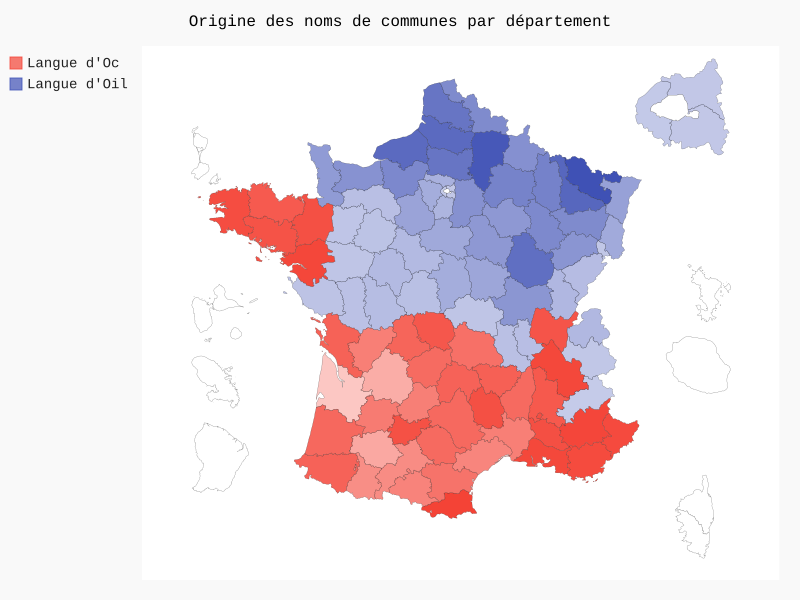

In [8]:
fr_chart = pygal.maps.fr.Departments(human_readable=True)
fr_chart.title = 'Origine des noms de communes par département'
fr_chart.add('Langue d\'Oc', dictOcc)
fr_chart.add('Langue d\'Oil', dictOil)

# Seconde méthode de calcul

Une commune peut correspondre à plusieurs règles, calculons son score dans le passage des règles pour déterminer son origine.

In [9]:
listOilCommune = []
listOccCommune = []
for row in df.itertuples():
    if type(row[1]) == bool:
        continue
    row[1].replace('-',' ')
    currentScore = 0
    for word in row[1].split(' '):
        if word.endswith("VILLE"):
            currentScore+=1
        if word.endswith("MONT") :
            currentScore +=1
        if word.endswith("AY") :
            currentScore +=1
        if word.endswith("EY") :
            currentScore +=1
        if word.endswith("ACH") :
            currentScore +=1
        if word.endswith("ICH") :
            currentScore +=1
        if word.endswith("ECQUE") :
            currentScore +=1
        if word.endswith("ECQUES") :
            currentScore +=1
        if word.endswith("IES") :
            currentScore +=1
        if word.endswith("IERS") :
            currentScore +=1
        if word.endswith("EZ") :
            currentScore +=1
        if word.endswith("ANGE") :
            currentScore +=1
        if word.endswith("ANGES") :
            currentScore +=1
        if word.endswith("ING") :
            currentScore +=1
        if word.endswith("INES") :
            currentScore +=1
        if word.endswith("INGUE") :
            currentScore +=1
        if word.endswith("INGEN") :
            currentScore +=1
        if word.endswith("HAM") :
            currentScore +=1
        if word.endswith("HEM") :
            currentScore +=1
        if word.endswith("HEIM") :
            currentScore +=1
        if word.endswith("COURT") :
            currentScore +=1
        if word.endswith("VILLER") :
            currentScore +=1
        if word.endswith("WILLER") :
            currentScore +=1
        if word.endswith("Y") :
            currentScore +=1
        if word.endswith("IN") :
            currentScore +=1
        if word.endswith("OSSE") :
            currentScore -=1 
        if word.endswith("OSQUE"):
            currentScore -=1
        if word.endswith("ASQUE"):
            currentScore -=1
        if word.endswith("AC") and row[4] > 0:
            currentScore -=1
        #if word.endswith("AT"):
        #    currentScore -=1
        if word.endswith("ACQ"):
            currentScore -=1
        if word.endswith("AS"):
            currentScore -=1
        #if word.endswith("AN"):
        #    currentScore -=1
        if word.endswith("ANS"):
            currentScore -=1
        if word.endswith("ARGUE"):
            currentScore -=1
        if word.endswith("ARGUES"):
            currentScore -=1
        if word.endswith("ENS"):
            currentScore -=1
        if word.endswith("EINS"):
            currentScore -=1
        if word.endswith("EIN"):
            currentScore -=1
        if word.endswith("VIELLE"):
            currentScore -=1
        if word.endswith("FIELLE"):
            currentScore -=1
        if word.startswith("CHATEAU"):
            currentScore -=1
        if word.startswith("MONT"):
            currentScore -=1
        if word.find("CAST") != -1:
            currentScore -=1
        if word.find("CAZ") != -1:
            currentScore -=1
        if word.find("LH") != -1:
            currentScore -=1
        if word.find("NH") != -1:
            currentScore -=1
        if word.find("QUERCY") != -1:
            currentScore -=1
    if currentScore > 0:
        listOilCommune.append(row)
    elif currentScore <0:
        listOccCommune.append(row)
    currentScore = 0

print(len(listOilCommune))
print(len(listOccCommune))

10380
3195


In [10]:
dict = {}
elementAux = ''
for element in listOilCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] += 1
    print("Oil : " + element[1] + " | "+ elementAux + " = " + str(dict[elementAux]))
for element in listOccCommune:
    if element[5] < 10:
         elementAux = "0"+str(element[5])
    else:
        elementAux = str(element[5])
    dict.setdefault(elementAux, 0)
    dict[elementAux] -= 1
    print("Occ : " + element[1] + " | " + elementAux + " = " + str(dict[elementAux]))
print(dict)
dictOil = {}
dictOcc= {}
for element in dict.keys():
    if dict[element] < 0:
        dictOcc.setdefault(element, 0)
        dictOcc[element] = dict[element]
    elif dict[element] > 0:
        dictOil.setdefault(element, 0)
        dictOil[element] = dict[element]
print(dictOil)
print(dictOcc)

Oil : LURCY | 01 = 1
Oil : APREMONT | 01 = 2
Oil : PLATEAU D HAUTEVILLE | 01 = 3
Oil : PIZAY | 01 = 4
Oil : ST GERMAIN DE JOUX | 01 = 5
Oil : THOISSEY | 01 = 6
Oil : CHAZEY SUR AIN | 01 = 7
Oil : ST SORLIN EN BUGEY | 01 = 8
Oil : VAUX EN BUGEY | 01 = 9
Oil : SOUCLIN | 01 = 10
Oil : NEUVILLE SUR AIN | 01 = 11
Oil : PONT D AIN | 01 = 12
Oil : ST MARTIN DU MONT | 01 = 13
Oil : PRIAY | 01 = 14
Oil : SEGNY | 01 = 15
Oil : CHEVRY | 01 = 16
Oil : VESANCY | 01 = 17
Oil : CESSY | 01 = 18
Oil : BOISSEY | 01 = 19
Oil : ARBIGNY | 01 = 20
Oil : FERNEY VOLTAIRE | 01 = 21
Oil : SAUVERNY | 01 = 22
Oil : GRILLY | 01 = 23
Oil : ST RAMBERT EN BUGEY | 01 = 24
Oil : TENAY | 01 = 25
Oil : CHALEY | 01 = 26
Oil : ST GERMAIN SUR RENON | 01 = 27
Oil : CERTINES | 01 = 28
Oil : HAUTECOURT ROMANECHE | 01 = 29
Oil : CHAMPAGNE EN VALROMEY | 01 = 30
Oil : HAUT VALROMEY | 01 = 31
Oil : VALROMEY SUR SERAN | 01 = 32
Oil : ARVIERE EN VALROMEY | 01 = 33
Oil : COLIGNY | 01 = 34
Oil : BEY | 01 = 35
Oil : ARBOYS EN BUGEY | 0

Oil : ST SERIES | 34 = 16
Oil : VILLENEUVE LES BEZIERS | 34 = 17
Oil : COLOMBIERS | 34 = 18
Oil : NISSAN LEZ ENSERUNE | 34 = 19
Oil : ST GENIES DE FONTEDIT | 34 = 20
Oil : THEZAN LES BEZIERS | 34 = 21
Oil : MURVIEL LES BEZIERS | 34 = 22
Oil : ST NAZAIRE DE LADAREZ | 34 = 23
Oil : BEZIERS | 34 = 24
Oil : LA VACQUERIE ET ST MARTIN DE CASTRIES | 34 = 25
Oil : PEZENES LES MINES | 34 = 26
Oil : ST GENIES DE VARENSAL | 34 = 27
Oil : ST THIBERY | 34 = 28
Oil : SOUMONT | 34 = 29
Oil : ST SATURNIN DE LUCIAN | 34 = 30
Oil : ST FELIX DE LODEZ | 34 = 31
Oil : PRADES LE LEZ | 34 = 32
Oil : CLERMONT L HERAULT | 34 = 33
Oil : CLAPIERS | 34 = 34
Oil : ST GELY DU FESC | 34 = 35
Oil : MOUTIERS | 35 = 1
Oil : VEZIN LE COQUET | 35 = 2
Oil : ST GERMAIN EN COGLES | 35 = 3
Oil : ST AUBIN DU CORMIER | 35 = 4
Oil : LONGAULNAY | 35 = 5
Oil : RETIERS | 35 = 6
Oil : ANDOUILLE NEUVILLE | 35 = 7
Oil : ST AUBIN D AUBIGNE | 35 = 8
Oil : ST GERMAIN SUR ILLE | 35 = 9
Oil : BONNEMAIN | 35 = 10
Oil : CREVIN | 35 = 11
Oil

Oil : LE PLESSIS DORIN | 41 = 27
Oil : FRANCAY | 41 = 28
Oil : ST LUBIN EN VERGONNOIS | 41 = 29
Oil : PRAY | 41 = 30
Oil : SANTENAY | 41 = 31
Oil : PRUNIERS EN SOLOGNE | 41 = 32
Oil : VILLEHERVIERS | 41 = 33
Oil : MILLANCAY | 41 = 34
Oil : ROMORANTIN LANTHENAY | 41 = 35
Oil : MARCILLY EN GAULT | 41 = 36
Oil : THOURY | 41 = 37
Oil : CROUY SUR COSSON | 41 = 38
Oil : VILLENY | 41 = 39
Oil : GY EN SOLOGNE | 41 = 40
Oil : COURMEMIN | 41 = 41
Oil : LASSAY SUR CROISNE | 41 = 42
Oil : VILLERMAIN | 41 = 43
Oil : AUTAINVILLE | 41 = 44
Oil : NEUVY | 41 = 45
Oil : FONTAINES EN SOLOGNE | 41 = 46
Oil : BAUZY | 41 = 47
Oil : BOURSAY | 41 = 48
Oil : BOUFFRY | 41 = 49
Oil : LE POISLAY | 41 = 50
Oil : ROMILLY | 41 = 51
Oil : CHAUVIGNY DU PERCHE | 41 = 52
Oil : VIEVY LE RAYE | 41 = 53
Oil : VILLENEUVE FROUVILLE | 41 = 54
Oil : ORCAY | 41 = 55
Oil : THEILLAY | 41 = 56
Oil : AMBLOY | 41 = 57
Oil : NOURRAY | 41 = 58
Oil : PRUNAY CASSEREAU | 41 = 59
Oil : MARAY | 41 = 60
Oil : CHAMPIGNY EN BEAUCE | 41 = 61
O

Oil : REEZ FOSSE MARTIN | 60 = 261
Oil : ROSOY EN MULTIEN | 60 = 262
Oil : QUESMY | 60 = 263
Oil : LIBERMONT | 60 = 264
Oil : CATIGNY | 60 = 265
Oil : GOLANCOURT | 60 = 266
Oil : BERLANCOURT | 60 = 267
Oil : MAUCOURT | 60 = 268
Oil : MUIRANCOURT | 60 = 269
Oil : FLAVY LE MELDEUX | 60 = 270
Oil : BEAUGIES SOUS BOIS | 60 = 271
Oil : HODENC EN BRAY | 60 = 272
Oil : GLATIGNY | 60 = 273
Oil : ST AUBIN EN BRAY | 60 = 274
Oil : VILLEMBRAY | 60 = 275
Oil : VILLERS ST BARTHELEMY | 60 = 276
Oil : VILLERS SUR AUCHY | 60 = 277
Oil : ONS EN BRAY | 60 = 278
Oil : ST GERMAIN LA POTERIE | 60 = 279
Oil : SAVIGNIES | 60 = 280
Oil : BLACOURT | 60 = 281
Oil : CRAMOISY | 60 = 282
Oil : ROUSSELOY | 60 = 283
Oil : GRANDFRESNOY | 60 = 284
Oil : CANLY | 60 = 285
Oil : ACHY | 60 = 286
Oil : LA NEUVILLE SUR OUDEUIL | 60 = 287
Oil : ROY BOISSY | 60 = 288
Oil : SACY LE GRAND | 60 = 289
Oil : ST MARTIN LONGUEAU | 60 = 290
Oil : BAZICOURT | 60 = 291
Oil : FLEURINES | 60 = 292
Oil : HOUDANCOURT | 60 = 293
Oil : ULLY 

Oil : ST REMY AU BOIS | 62 = 363
Oil : GOUY ST ANDRE | 62 = 364
Oil : SAULCHOY | 62 = 365
Oil : VENDIN LE VIEIL | 62 = 366
Oil : ANNAY | 62 = 367
Oil : PONT A VENDIN | 62 = 368
Oil : AUDREHEM | 62 = 369
Oil : MENTQUE NORTBECOURT | 62 = 370
Oil : RECQUES SUR HEM | 62 = 371
Oil : NORT LEULINGHEM | 62 = 372
Oil : TOURNEHEM SUR LA HEM | 62 = 373
Oil : MORINGHEM | 62 = 374
Oil : BAYENGHEM LES EPERLECQUES | 62 = 375
Oil : EPERLECQUES | 62 = 376
Oil : GONNEHEM | 62 = 377
Oil : OBLINGHEM | 62 = 378
Oil : HAILLICOURT | 62 = 379
Oil : FEBVIN PALFART | 62 = 380
Oil : FLECHIN | 62 = 381
Oil : LIGNY LES AIRE | 62 = 382
Oil : BOMY | 62 = 383
Oil : ERNY ST JULIEN | 62 = 384
Oil : WESTREHEM | 62 = 385
Oil : MARESQUEL ECQUEMICOURT | 62 = 386
Oil : OFFIN | 62 = 387
Oil : BEAURAINVILLE | 62 = 388
Oil : LEBIEZ | 62 = 389
Oil : LESPINOY | 62 = 390
Oil : EMBRY | 62 = 391
Oil : CLERMONT FERRAND | 63 = 1
Oil : BEAUMONT | 63 = 2
Oil : CHATEAUGAY | 63 = 3
Oil : VOLLORE VILLE | 63 = 4
Oil : NEUVILLE | 63 = 5
Oil

Oil : GY L EVEQUE | 89 = 180
Oil : ST FLORENTIN | 89 = 181
Oil : VERGIGNY | 89 = 182
Oil : GERMIGNY | 89 = 183
Oil : BEAUVILLIERS | 89 = 184
Oil : ST GERMAIN DES CHAMPS | 89 = 185
Oil : FONTENAY SOUS FOURONNES | 89 = 186
Oil : BOIS D ARCY | 89 = 187
Oil : MERRY SUR YONNE | 89 = 188
Oil : CHEROY | 89 = 189
Oil : TRONCHOY | 89 = 190
Oil : CHENEY | 89 = 191
Oil : ROFFEY | 89 = 192
Oil : ST MARTIN SUR ARMANCON | 89 = 193
Oil : VIVIERS | 89 = 194
Oil : JUNAY | 89 = 195
Oil : TISSEY | 89 = 196
Oil : SERRIGNY | 89 = 197
Oil : ARTHONNAY | 89 = 198
Oil : CRUZY LE CHATEL | 89 = 199
Oil : CHAILLEY | 89 = 200
Oil : AIGREMONT | 89 = 201
Oil : MALIGNY | 89 = 202
Oil : CHEMILLY SUR SEREIN | 89 = 203
Oil : FONTENAY PRES CHABLIS | 89 = 204
Oil : LICHERES PRES AIGREMONT | 89 = 205
Oil : PREHY | 89 = 206
Oil : VILLY | 89 = 207
Oil : FLORIMONT | 90 = 1
Oil : LEBETAIN | 90 = 2
Oil : JONCHEREY | 90 = 3
Oil : THIANCOURT | 90 = 4
Oil : ST GERMAIN LE CHATELET | 90 = 5
Oil : ROMAGNY SOUS ROUGEMONT | 90 = 6
Oil 

Occ : ST NICOLAS DES BIEFS | 03 = 53
Occ : CHATEAU SUR ALLIER | 03 = 52
Occ : MONTMARAULT | 03 = 51
Occ : PREMILHAT | 03 = 50
Occ : MONTORD | 03 = 49
Occ : BRUGHEAS | 03 = 48
Occ : MONTEIGNET SUR L ANDELOT | 03 = 47
Occ : MANOSQUE | 04 = 14
Occ : MONTFURON | 04 = 13
Occ : AUBENAS LES ALPES | 04 = 12
Occ : CASTELLANE | 04 = 11
Occ : SOLEILHAS | 04 = 10
Occ : MONTCLAR | 04 = 9
Occ : MONTSALIER | 04 = 8
Occ : CHATEAU ARNOUX ST AUBAN | 04 = 7
Occ : LA MURE ARGENS | 04 = 6
Occ : CHATEAUNEUF MIRAVAIL | 04 = 5
Occ : CHATEAUNEUF VAL ST DONAT | 04 = 4
Occ : VAUMEILH | 04 = 3
Occ : MONTLAUX | 04 = 2
Occ : CHATEAUFORT | 04 = 1
Occ : CHATEAUREDON | 04 = 0
Occ : BRAS D ASSE | 04 = -1
Occ : SALIGNAC | 04 = -2
Occ : LIMANS | 04 = -3
Occ : CASTELLET LES SAUSSES | 04 = -4
Occ : MEOLANS REVEL | 04 = -5
Occ : BARRAS | 04 = -6
Occ : LE CASTELLARD MELAN | 04 = -7
Occ : MONTAGNAC MONTPEZAT | 04 = -8
Occ : MONTFORT | 04 = -9
Occ : LE CASTELLET | 04 = -10
Occ : CHATEAUVIEUX | 05 = 18
Occ : MONTGENEVRE | 05 = 

OSError: no library called "cairo-2" was found
no library called "cairo" was found
no library called "libcairo-2" was found
cannot load library 'libcairo.so.2': error 0x7e
cannot load library 'libcairo.2.dylib': error 0x7e
cannot load library 'libcairo-2.dll': error 0x7e

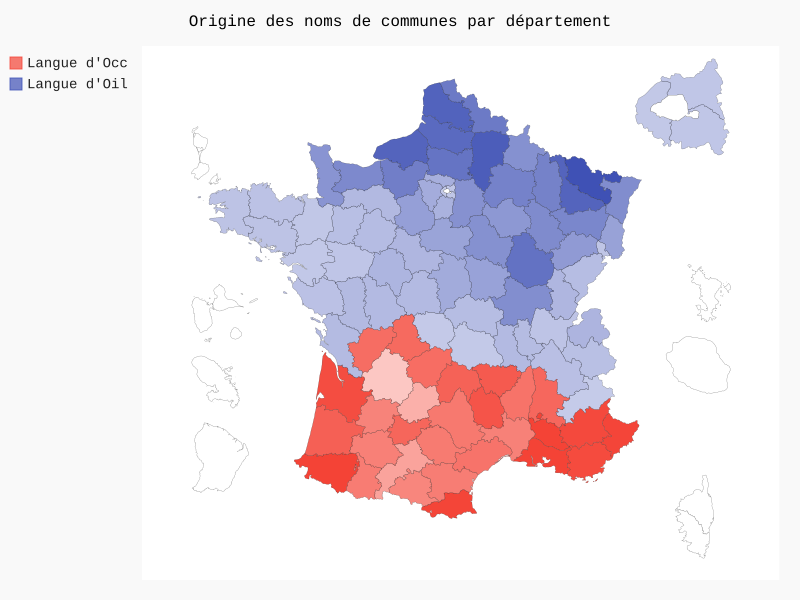

In [11]:
fr_chart = pygal.maps.fr.Departments(human_readable=True)
fr_chart.title = 'Origine des noms de communes par département'
fr_chart.add('Langue d\'Occ', dictOcc)
fr_chart.add('Langue d\'Oil', dictOil)

In [13]:
import plotly.express as px
dataframeAux1 = pd.DataFrame(data=listOccCommune)
dataframeAux1['color'] = "red"
dataframeAux2 = pd.DataFrame(data=listOilCommune)
dataframeAux2['color'] = "aqua"
dataframe = pd.concat([dataframeAux1, dataframeAux2])
fig = px.scatter_mapbox(dataframe, lat="latitude", lon="longitude", hover_name="Nom_commune",
                        color_discrete_sequence=[dataframe.color], zoom=5, height=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [16]:
dataframe

,Index,Nom_commune,Code_postal,latitude,longitude,DPT,_6,_7,color
0,3,FRANCHELEINS,1090,46.073595,4.812936,1,Ain,NaN,red
1,4,GUEREINS,1090,46.106625,4.781594,1,Ain,NaN,red
2,8,MONTCEAUX,1090,46.096289,4.804536,1,Ain,NaN,red
3,9,MONTMERLE SUR SAONE,1090,46.084957,4.760858,1,Ain,NaN,red
4,31,MONTLUEL,1120,45.890901,5.019876,1,Ain,NaN,red
...,...,...,...,...,...,...,...,...,...
10375,38708,FREMECOURT,95830,49.123496,1.993477,95,Val-d'Oise,NaN,aqua
10376,38709,CORMEILLES EN VEXIN,95830,49.113433,2.019779,95,Val-d'Oise,NaN,aqua
10377,38710,VILLIERS ADAM,95840,49.070289,2.239509,95,Val-d'Oise,NaN,aqua
10378,38711,BETHEMONT LA FORET,95840,49.054317,2.251140,95,Val-d'Oise,NaN,aqua


In [17]:
import plotly.express as px
dataframeAux1 = pd.DataFrame(data=listOccCommune)
dataframeAux1['color'] = "red"
dataframeAux2 = pd.DataFrame(data=listOilCommune)
dataframeAux2['color'] = "aqua"
dataframe = pd.concat([dataframeAux1, dataframeAux2])
fig = px.scatter_mapbox(dataframe, lat="latitude", lon="longitude", hover_name="Nom_commune",
                        color_discrete_sequence=[dataframe.color], zoom=5, height=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [18]:
listOilCommune = []
listOccCommune = []
for row in df.itertuples():
    if type(row[1]) == bool:
        continue
    row[1].replace('-',' ')
    currentScore = 0
    for word in row[1].split(' '):
        #if word.endswith("EUC"):
        #    currentScore +=1
        if word.endswith("AN"):
            currentScore +=1
        #if word.find("QU") != -1:
        #    currentScore -=1
    if currentScore > 0:
        listOilCommune.append(row)
    elif currentScore <0:
        listOccCommune.append(row)
    currentScore = 0

print(len(listOilCommune))
print(len(listOccCommune))

891
0


In [19]:
import plotly.express as px
dataframeAux1 = pd.DataFrame(data=listOccCommune)
dataframeAux1['color'] = "red"
dataframeAux2 = pd.DataFrame(data=listOilCommune)
dataframeAux2['color'] = "red"
dataframe = pd.concat([dataframeAux1, dataframeAux2])
fig = px.scatter_mapbox(dataframe, lat="latitude", lon="longitude", hover_name="Nom_commune",
                        color_discrete_sequence=[dataframe.color], zoom=5, height=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()